In [1]:
!pip install pretty_midi
!pip install Instrument
!pip install mido


You should consider upgrading via the 'pip install --upgrade pip' command.
  Using cached https://files.pythonhosted.org/packages/0c/af/1411bb75462690ff6426edb6eba57bd03d0ac7a668d951fe6337a1106704/instrument-0.6.0.tar.gz
  Created wheel for Instrument: filename=instrument-0.6.0-cp36-none-any.whl size=10993 sha256=aa5c2abf911f8717c56d1341bfef8ae799c74fa7b7e20ea9327806a45bedb46e
  Stored in directory: /usr4/ec523/tranhp/.cache/pip/wheels/3d/37/67/e371f926934582de6a6ff27130d4d17610661f35c7ed61ab2b
Successfully built Instrument
ERROR: Could not install packages due to an EnvironmentError: [Errno 13] Permission denied: '/share/pkg.7/python3/3.6.9/install/lib/python3.6/site-packages/instrument'
Consider using the `--user` option or check the permissions.

You should consider upgrading via the 'pip install --upgrade pip' command.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
from pretty_midi.constants import DRUM_MAP, INSTRUMENT_MAP, INSTRUMENT_CLASSES
import numpy as np
import re
from pretty_midi.utilities import key_number_to_key_name
from pretty_midi.containers import PitchBend
from pretty_midi.instrument import Instrument
import os
import pretty_midi
from scipy.io import wavfile 
import IPython
import matplotlib.pyplot as plt
import numpy as np
import glob
import math

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torch.utils import data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision import transforms as T
from torchvision.datasets import ImageFolder
from torch.autograd import Variable
from torchvision.utils import save_image
from torch.backends import cudnn

# checking if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
torch.cuda.ipc_collect()
torch.cuda.empty_cache() 

In [5]:
n_x = 108
max_T_x = 1000
sequence_length = 20
T_y_generated = 200

import os
from os import listdir
from os.path import isfile, join

# Modify this path to your own MAESTRO dataset
maestro_dir = 'data/maestro-v2.0.0'

data_dirs = []
#for year in ['2004', '2006', '2008', '2009', '2011', '2013', '2014', '2015', '2017', '2018']:
for year in ['2004']:
    data_dirs.append(maestro_dir + '/' + str(year))

#data_dirs.append(maestro_dir + '/train')

data_files = []
for data_dir in data_dirs:
    data_files += [join(data_dir, f) for f in listdir(data_dir) if isfile(join(data_dir, f)) if 'midi' in f]

data_files.sort()

print('total midi files : ', len(data_files))

total midi files :  132


In [6]:
max_pitch = 0
for midiFile in data_files:
    # read the MIDI file
    midi_data = pretty_midi.PrettyMIDI(midiFile)
    note_l = [note.pitch for note in midi_data.instruments[0].notes]
    if (np.max(note_l) >= max_pitch):
      max_pitch = np.max(note_l)

n_x = max_pitch
print(n_x)

108


In [6]:
X_list = []

for midiFile in data_files:
    # read the MIDI file
    midi_data = pretty_midi.PrettyMIDI(midiFile)
    note_l = [note.pitch for note in midi_data.instruments[0].notes]
    # convert to one-hot-encoding
    T_x = len(note_l)
    if T_x > max_T_x:
      T_x = max_T_x
    # add to the list  
    X_list.append(note_l[:T_x])

(1000, 108)


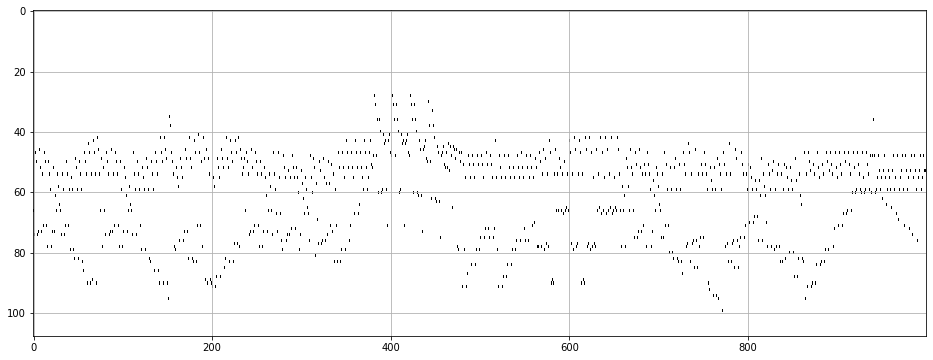

In [7]:
# convert to one-hot-encoding
X_ohe = np.zeros((len(X_list[0]), n_x))
for t in range(len(X_list[0])): 
  X_ohe[t, note_l[t]-1] = 1

print(X_ohe.shape)

plt.figure(figsize=(16, 6))
plt.imshow(np.transpose(X_ohe), aspect='auto')
plt.set_cmap('gray_r')
plt.grid(True)

In [8]:
import math 

train_percentage = 0.8
test_percentage = 0.2
no_train_sample=math.ceil(len(X_list)*train_percentage)
no_test_sample = len(X_list) - no_train_sample

# CODE-RNN2-1
# --- START CODE HERE
X_train_list = [X_list[i][t:t+sequence_length] for i in range(no_train_sample) for t in range(len(X_list[i])-sequence_length)]
y_train_list = [X_list[i][t+sequence_length:t+sequence_length+1] for i in range(no_train_sample) for t in range(len(X_list[i])-sequence_length)]

X_test_list = [X_list[i][t:t+sequence_length] for i in range(no_test_sample) for t in range(len(X_list[i])-sequence_length)]
y_test_list = [X_list[i][t+sequence_length:t+sequence_length+1] for i in range(no_test_sample) for t in range(len(X_list[i])-sequence_length)]
# --- END CODE HERE

X_train = np.asarray(X_train_list)
y_train = np.asarray(y_train_list)

X_test = np.asarray(X_test_list)
y_test = np.asarray(y_test_list)


print("X_train.shape:", X_train.shape)
print("y_train.shape:", y_train.shape)

print("X_test.shape:", X_test.shape)
print("y_test.shape:", y_test.shape)

X_train.shape: (103686, 20)
y_train.shape: (103686, 1)
X_test.shape: (25480, 20)
y_test.shape: (25480, 1)


In [9]:
feature_train = np.asarray(X_train)
label_train = np.asarray(y_train)

feature_test = np.asarray(X_test)
label_test = np.asarray(y_test)

In [10]:
feature_train = torch.from_numpy(feature_train).to(device)
label_train = torch.from_numpy(label_train).to(device)

feature_test = torch.from_numpy(feature_test).to(device)
label_test = torch.from_numpy(label_test).to(device)

# label_train = torch.from_numpy(new_y_train)
print(feature_train.shape)
print(label_train.shape)

torch.Size([103686, 20])
torch.Size([103686, 1])


In [11]:
from torch.utils.data import TensorDataset, DataLoader
batch_size = 1028
train_data = TensorDataset(feature_train, label_train)
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size)

test_data = TensorDataset(feature_test, label_test)
test_loader = DataLoader(test_data, shuffle=True, batch_size=batch_size)

In [12]:
class Network(nn.Module):
    
    def __init__(self, input_dim, output_dim):
        super().__init__()
        self.conv1 = nn.Conv1d(in_channels = 1, out_channels = 16, kernel_size =3 )
        self.conv2 = nn.Conv1d(in_channels=16, out_channels=32, kernel_size=2)

#         self.conv1 = nn.Conv1d(in_channels = 1, out_channels = 16, kernel_size =5 )
#         self.conv2 = nn.Conv1d(in_channels=16, out_channels=32, kernel_size=5)
        
        
#         self.pool = nn.MaxPool1d(2,2)
        
        #self.fc1 = nn.Conv1d(in_channels = 6, out_channels = 12, kernel_size = 1)
        #self.fc2 = nn.Conv1d(in_channels = 12, out_channels = 5, kernel_size = 1)
        
#         self.fc1 = nn.Linear(in_features=204, out_features= 20)
#         self.drop1 = nn.Dropout(p=0.3)
#         self.fc2 = nn.Linear(in_features=20, out_features=10)
#         self.drop2 = nn.Dropout(p=0.3)
#         self.out = nn.Linear(in_features=10, out_features = output_dim)

        self.fc1 = nn.Linear(in_features=544, out_features= 128)
        self.drop1 = nn.Dropout(p=0.2)
        self.fc2 = nn.Linear(in_features=128, out_features=64)
        self.drop2 = nn.Dropout(p=0.2)
        self.fc3 = nn.Linear(in_features=64, out_features=10)
        self.drop3 = nn.Dropout(p=0.2)
        self.out = nn.Linear(in_features=10, out_features = output_dim)
        
    def forward(self, t):
        
        t = t.unsqueeze(1) 
        # (2) hidden conv layer
#         print("first", t.shape)
        t = F.relu(self.conv1(t))
#         print("second", t.shape)
#         t = self.pool(t)


        # (3) hidden conv layer
        t = F.relu(self.conv2(t))
#         t = self.pool(t)

#         t = F.relu(self.conv3(t))
#         t = F.relu(self.conv4(t))

        # (4) hidden linear layer
        #t = t.reshape(-1, 6*2*8)
        t = t.view(t.size(0),-1)
#         print("third", t.shape)
        t = self.fc1(t)
        t= self.drop1(t)
        t = F.relu(t)

        # (5) hidden linear layer
        t = self.fc2(t)
        t = self.drop2(t)
        t = F.relu(t)
        
        # (6) hidden linear layer
        t = self.fc3(t)
        t = self.drop3(t)
        t = F.relu(t)

        # (7) output layer
#         print("fourth", t.shape)
        t = self.out(t)
        #t = F.softmax(t, dim =1)
        #t = F.softmax(t, dim=1)
        return t
   

In [13]:


# defining the model
model = Network(input_dim = feature_train.shape[1], output_dim = label_train.shape[1]).to(device)
# defining the optimizer
optimizer = optim.AdamW(model.parameters())
schedule = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max = 200 )
# defining the loss function
criterion = nn.MSELoss()
# criterion = nn.CrossEntropyLoss()

if device==torch.device("cuda"):
    model = torch.nn.DataParallel(model)
    cudnn.benchmark = True


print(model)

DataParallel(
  (module): Network(
    (conv1): Conv1d(1, 16, kernel_size=(3,), stride=(1,))
    (conv2): Conv1d(16, 32, kernel_size=(2,), stride=(1,))
    (fc1): Linear(in_features=544, out_features=128, bias=True)
    (drop1): Dropout(p=0.2, inplace=False)
    (fc2): Linear(in_features=128, out_features=64, bias=True)
    (drop2): Dropout(p=0.2, inplace=False)
    (fc3): Linear(in_features=64, out_features=10, bias=True)
    (drop3): Dropout(p=0.2, inplace=False)
    (out): Linear(in_features=10, out_features=1, bias=True)
  )
)


In [14]:
loss = []
def train(epoch):
    model.train()
    tr_loss = 0
    x_train = feature_train.float()
    y_train = label_train.float()
    # converting the data into GPU format
    #if torch.cuda.is_available():
        #x_train = x_train.cuda()
        #y_train = y_train.cuda()
    i = 0
    for inputs, labels in train_loader:
        inputs = inputs.float()
        labels = labels.float()
    # clearing the Gradients of the model parameters
        optimizer.zero_grad()

        # prediction for training and validation set
        #print(x_train)
        output_train = model(inputs)
#         output_train = model(x_train.float())
        
        

        # computing the training and validation loss
        #print("out",output_train.shape)
        #print("label",y_train.shape)
        #print("label",y_train)
#         print(output_train.shape, y_train.squeeze(1).shape)
#         loss_train = criterion(output_train, y_train.squeeze(1).long()-21)
        loss_train = criterion(output_train, labels)
#         loss_train = criterion(output_train, y_train)


        # computing the updated weights of all the model parameters
        loss_train.backward()
        optimizer.step()
        tr_loss = loss_train.item()
        #print("run through")
        #print("update i", i)
        #loss.append(loss_train.item())
        if i % 10 == 0:    # print every 2000 mini-batches
#             print(torch.sum(output_train==labels))
            if i % 500 == 0:
                print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, tr_loss / 5))
            loss.append(tr_loss / 5)
            tr_loss = 0.0
            
        i += 1
        
    print(torch.sum(output_train==labels))

In [15]:
# defining the number of epochs
n_epochs = 100
# training the model
for epoch in range(n_epochs):
    train(epoch)

[1,     1] loss: 805.483
tensor(0, device='cuda:0')
[2,     1] loss: 70.585
tensor(0, device='cuda:0')
[3,     1] loss: 69.845
tensor(0, device='cuda:0')
[4,     1] loss: 66.386
tensor(0, device='cuda:0')
[5,     1] loss: 66.998
tensor(0, device='cuda:0')
[6,     1] loss: 65.104
tensor(0, device='cuda:0')
[7,     1] loss: 65.637
tensor(0, device='cuda:0')
[8,     1] loss: 67.552
tensor(0, device='cuda:0')
[9,     1] loss: 62.329
tensor(0, device='cuda:0')
[10,     1] loss: 62.246
tensor(0, device='cuda:0')
[11,     1] loss: 66.351
tensor(0, device='cuda:0')
[12,     1] loss: 60.553
tensor(0, device='cuda:0')
[13,     1] loss: 59.520
tensor(0, device='cuda:0')
[14,     1] loss: 61.524
tensor(0, device='cuda:0')
[15,     1] loss: 62.068
tensor(0, device='cuda:0')
[16,     1] loss: 60.805
tensor(0, device='cuda:0')
[17,     1] loss: 63.324
tensor(0, device='cuda:0')
[18,     1] loss: 57.007
tensor(0, device='cuda:0')
[19,     1] loss: 59.966
tensor(0, device='cuda:0')
[20,     1] loss: 59

Text(0, 0.5, 'Training Loss')

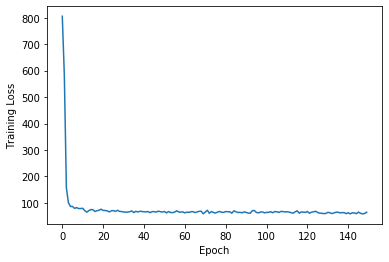

In [16]:
import matplotlib.pyplot as plt
plot = plt.plot(loss[:150])
plt.xlabel('Epoch')
plt.ylabel('Training Loss')

In [17]:
model.eval()
'''
First we will cheat a bit and use a sample from the training loader. 
Then we will generate a sequence by generating each note looking at 
real 20 notes that are behind it
'''
dataiter = iter(train_loader)
sample_x, sample_y = dataiter.next()
sample_x = sample_x.to(device)
sample_y = sample_y.to(device)
out = model(sample_x.float())
out = np.ceil(out.detach().cpu().numpy()).astype(int)
out = torch.from_numpy(out).to(device)
out = out.squeeze(1).to(device)
out = out[:256]

In [18]:
print(sample_x[0].shape)
print(out)
# print(sample_x[0])
# # print(torch.cat((sample_x[0],torch.from_numpy(out).squeeze(1)),0)) 


torch.Size([20])
tensor([51, 51, 50, 53, 55, 55, 55, 55, 59, 51, 54, 59, 51, 54, 58, 46, 53, 53,
        51, 54, 56, 61, 50, 41, 43, 57, 69, 59, 59, 56, 51, 54, 68, 55, 42, 52,
        46, 50, 54, 57, 58, 55, 52, 60, 55, 51, 45, 47, 51, 55, 53, 61, 55, 48,
        59, 49, 51, 51, 71, 50, 54, 48, 58, 50, 62, 47, 50, 50, 52, 51, 51, 45,
        57, 55, 54, 47, 51, 56, 50, 62, 51, 57, 51, 55, 45, 62, 51, 54, 51, 56,
        48, 62, 50, 51, 63, 48, 54, 68, 40, 55, 58, 55, 47, 51, 52, 59, 52, 53,
        53, 48, 52, 50, 45, 53, 61, 49, 55, 55, 55, 54, 56, 53, 55, 55, 57, 61,
        56, 52, 58, 65, 51, 54, 55, 45, 54, 49, 50, 55, 57, 57, 53, 62, 45, 62,
        58, 56, 54, 48, 55, 56, 51, 55, 54, 54, 56, 57, 53, 46, 50, 49, 61, 45,
        54, 60, 49, 55, 55, 42, 56, 54, 52, 53, 45, 54, 55, 62, 45, 64, 51, 61,
        61, 60, 56, 53, 53, 52, 60, 57, 54, 51, 58, 54, 57, 49, 45, 59, 68, 53,
        54, 60, 52, 54, 55, 43, 49, 53, 66, 51, 66, 53, 57, 54, 59, 54, 55, 52,
        51, 59, 56, 59,

In [19]:
new_midi_data = pretty_midi.PrettyMIDI()
piano_program = pretty_midi.instrument_name_to_program('Acoustic Grand Piano')
piano = pretty_midi.Instrument(program=piano_program)
time = 1e-20
step = 0.3

entire_seq = torch.cat((sample_x[0],out),0)
for note_number in entire_seq:
    note_number = note_number.item()
    myNote = pretty_midi.Note(velocity=120, pitch=note_number, start=time, end=time+step)
    piano.notes.append(myNote)
    time += step
new_midi_data.instruments.append(piano)

print('Generating audio by using actual previous 20 notes to generate each new note')

audio_data = new_midi_data.synthesize()
IPython.display.Audio(audio_data, rate=44100)




Generating audio by using actual previous 20 notes to generate each new note


In [21]:
'''
Now we will properly test our model by only using the 
first actual 20 notes and letting the generator completely take over from there
'''


dataiter = iter(test_loader)

In [22]:

test_sample_x, test_sample_y = dataiter.next()
test_sample_x = test_sample_x.to(device)
test_sample_y = test_sample_y.to(device)

generated_seq = test_sample_x[0].clone().unsqueeze(0)
num_generate = 256


print('original', generated_seq)
for i in range(num_generate):
    last20 = generated_seq[0][i:i+sequence_length].unsqueeze(0)
    out = model(last20.float())
#     print(out.shape)
    out = torch.round(out)
    
#     out = np.round(out.detach().cpu().numpy()).astype(int)
#     out = torch.from_numpy(out).to(device)
    generated_seq = torch.cat((generated_seq,out),1)

# generated_seq = generated_seq.int()
print('generated',generated_seq)



original tensor([[62, 58, 61, 70, 76, 57, 69, 62, 77, 59, 71, 79, 61, 73, 64, 57, 76, 62,
         74, 65]], device='cuda:0')
generated tensor([[62., 58., 61., 70., 76., 57., 69., 62., 77., 59., 71., 79., 61., 73.,
         64., 57., 76., 62., 74., 65., 58., 56., 56., 55., 53., 53., 52., 49.,
         48., 48., 47., 46., 45., 44., 44., 43., 43., 42., 42., 41., 41., 41.,
         40., 40., 40., 39., 39., 39., 39., 38., 38., 38., 38., 38., 38., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37.,
         37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 37., 

In [23]:
test_midi_data = pretty_midi.PrettyMIDI()
piano_program = pretty_midi.instrument_name_to_program('Acoustic Grand Piano')
piano = pretty_midi.Instrument(program=piano_program)
time = 1e-20
step = 0.3

for note_number in generated_seq[0]:
    note_number = note_number.item()
    myNote = pretty_midi.Note(velocity=120, pitch=note_number, start=time, end=time+step)
    piano.notes.append(myNote)
    time += step
test_midi_data.instruments.append(piano)

audio_data = test_midi_data.synthesize()
IPython.display.Audio(audio_data, rate=44100)